<a href="https://colab.research.google.com/github/williamlidberg/Mapping-drainage-ditches-in-forested-landscapes-using-deep-learning-and-aerial-laser-scannlidar-data/blob/DitchNet-0.5-m-resolution/Mapping_drainage_ditches_in_forested_landscapes_using_deep_learning_and_aerial_laser_scanning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mapping drainage ditches in forested landscapes using deep learning and aerial laser scanning
## Abstract 
Increasing understanding of environmental risks associated with forest ditches makes mapping these ditches a priority for sustainable management. Here, we present the first rigorous deep learning-based methodology to map forest ditches at regional scale. A deep neural network was trained on high-density aerial laser scanning (ALS) data and 1607 km of manually mapped ditch channels spread across Sweden. The model proved to be accurate when evaluated on other heavily ditched countries in the Baltic Sea Region. Further, these results provides a significant contribution to the assessment of regional hydrology and ecosystem dynamics in forested landscapes.



## Method 
We trained a deep neural network on high-density ALS data and manually digitized ditches from 10 regions across Sweden. 20 % of the data was set aside for testing the final model. In addition to this testing data, the model was also applied to four study areas spread across Sweden, Finland, Latvia, and Poland (Figure 1A).

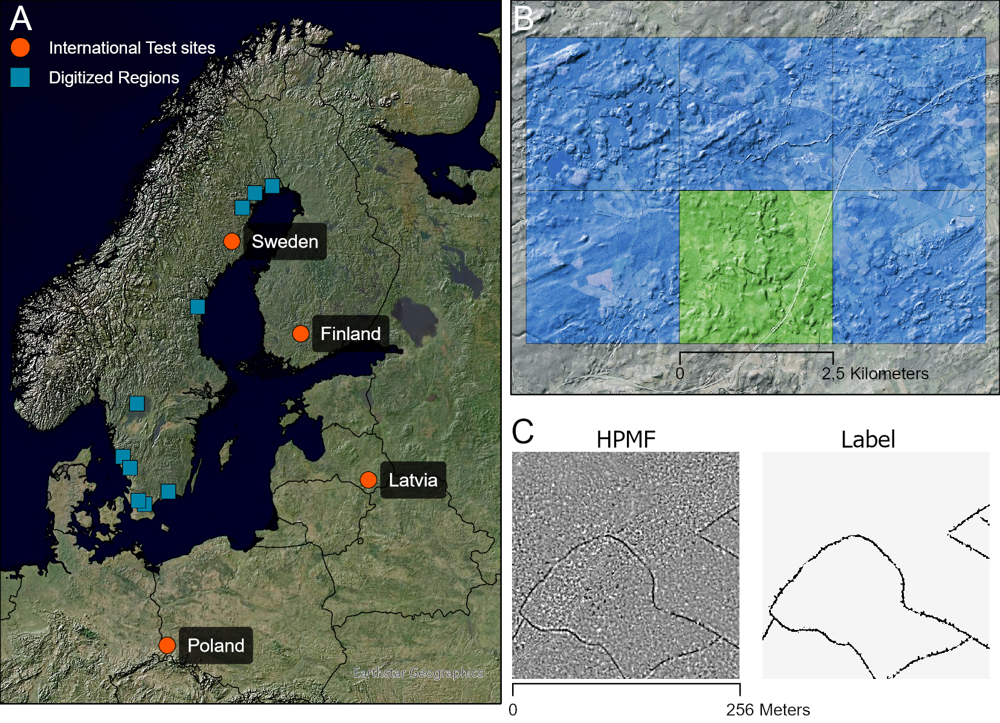

Figure 1. Training and testing data. Panel A) Blue squares indicate locations of the digitized regions with training/testing data and red points indicate locations of the additional international test areas. B) Close up of the tiles in one region. Blue tiles were used for training and green tiles were used for testing. C) Example of a high pass median filter (HPMF) image chip and corresponding label chip.

## Training dataset  
The 10 digitized regions are dominated by forest and the regions were selected to achieve a broad representation of different landscape properties concerning topography, soil conditions, runoff, land-use and tree species. The ALS point clouds have a density of 1-2 points m-2 and were divided into 55 tiles with the size of 2.5 x 2.5 km each and covering a total of 344 km2. DEMs with 0.5 m resolution were created from the ALS point clouds using a tin gridding approach implemented in Whitebox tools 1.4.0 (Lindsay, 2018). A high pass median filter (HPMF) was applied to the DEMs to emphasize short-range variability in the topography. The HPMF-algorithm was implemented in Whitebox tools (Lindsay, 2018) and operated by subtracting the value at the grid cell at the center of the window from the median value in the surrounding neighborhood with a kernel of 11 cells. Negative values indicate depressions while positive values indicate ridges.
## Labels
Ditches were manually digitized as vector lines based on a multidirectional hillshaded DEM and a HPMF. This made it easy to separate local ridges from local depressions (e.g. ditch channels). 20 % of the 55 tiles (n=11) were randomly selected for model testing and were not used to train the model (Figure 1B). The digitized vector lines have no width so we utilized average ditch width from a field inventory where 2188 ditch channels were inventoried in the field (from a national inventory of Swedish landscapes). The average ditch width was 2 m with a standard deviation of 1.3 m. Instead of flagging all pixels within 3 m of a vector line as ditch, we utilized the HPMF to create more natural ditch labels. Pixels within three meters of a vector line and with a HPMF value less than -0.075 were flagged as ditch pixels. The threshold value of -0.075 was selected based on visual observations of ditch channels during the digitalization of the ditches.  Spurious pixels that were not connected to a ditch were removed using a majority filter with a 3 cell kernel (SI1). In total 1607 km of ditch channels were mapped in this manner (“Mendeley Data,” n.d.). 
## Deep learning model
The HPMF and labeled data were split into pairs of image chips with 512 x 512 pixels in each chip (Figure 1C). Image chips where ditches made up less than 0.1 % of all pixels in the chip were removed to combat the highly imbalanced class distribution—clearly, most pixels in the data are non-ditch. We used TensorFlow 2.6 to build an encoder-decoder style deep neural network to transform the filtered DEM images into images highlighting the detected ditches. On the encoding path, we applied Xception blocks with residual connections (Chollet, 2017), as shown in Figure 2. 


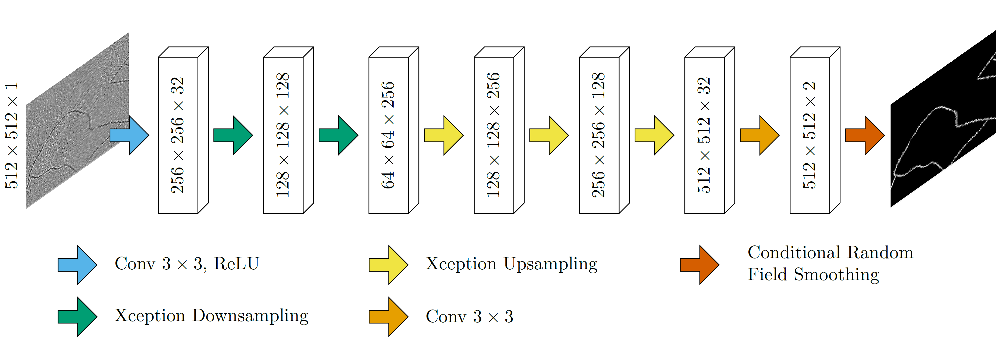

Figure 2. Overall network architecture. The intermediate blocks show the number and size of the created feature maps.

The up-sampling path then consists of transposed convolutions and residual connections and outputs the final classification map, which contains, for every pixel in the input image, the probability that the pixel belongs to a ditch. The produced classification map is smoothed using the conditional random field layer proposed by (Zheng et al., 2015). This neural network model is trained using weighted cross-entropy loss to deal with the large class imbalance between ditch and non-ditch pixels (SI2).

## Set up google drive and mount training data
Code and training data are stored in my google drive

In [1]:
from google.colab import drive
drive.mount('/content/mydrive', force_remount=True)

Mounted at /content/mydrive


The images were exported using arcgis pro. Install imagecodecs to handle arcgis compression in google colab


In [2]:
pip install imagecodecs

     |████████████████████████████████| 29.6 MB 27 kB/s 


The dependencies are:
cv2,
numpy,
import tifffile,
osgeo,
gdal,
tensorflow

The data was first split into training data (80 %) and testing data (20 %). The training data was further split into 80 % traning and 20 % validation data. This second split was done to enable a degree of experimentation and validation before the final model was applied to the test dataset. 

In [3]:
import glob
listoftraininglabels = glob.glob('/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/labels/*.tif', recursive = True)
print('There are', (len(listoftraininglabels)), 'labeled chips in the training data')
listoftestinglabels = glob.glob('/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Testing_data/labels/*.tif', recursive = True)
print('There are', (len(listoftestinglabels)), 'labeled chips in the testing data')

There are 1870 labeled chips in the training data
There are 497 labeled chips in the testing data


## Set up tensorboard

In [5]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/basemodel


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 438), started 0:03:28 ago. (Use '!kill 438' to kill it.)

<IPython.core.display.Javascript object>

## Train CNN

In [6]:
%env PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"


env: PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"


In [ ]:
!python /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/train.py /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/images /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/labels /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/basemodel XceptionUNet --seed 123 --epochs 100 --steps_per_epoch 100


2021-08-13 07:05:58.499868: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/images/000000000south.tif
New Epoch
/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/images/000000000south.tif
New Epoch
2021-08-13 07:06:28.977971: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-13 07:06:29.032866: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-13 07:06:29.033571: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08G

## Conditional Random Fields as Recurrent Neural Networks CRF-RNN
Conditional Random Fields as Recurrent Neural Networks is a new form of convolutional neural network that combinesthe  strengths  of  Convolutional  Neural  Networks  (CNNs)and Conditional Random Fields (CRFs)-based probabilisticgraphical modelling. A CRF-RNN, is plugged in as a part of the CNN to obtain a deep network that has desirable  properties  of  both  CNNs  and  CRFs. https://github.com/sadeepj/crfasrnn_keras paper: https://www.robots.ox.ac.uk/~szheng/papers/CRFasRNN.pdf



## Train CRF-RNN
Traincrf script, images, labels, trained CCN model, textfile with a list of images that the CNN trained on, number of epochs, steps_per_epoch

The CRF network cannot be trained using GPU but a GPU can be used for inference if the GPU brach is used: https://github.com/sadeepj/crfasrnn_keras/tree/gpu_support

train_crf script, images, labels, trained CNN model, log of CRFRNN model, textfile with list of images that the CNN trained on, number of epocs, steps per epoch

The CRF layer will be trained for 42 epochs and 100 steps per epoch

In [ ]:
%env PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"
!python /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/train_crf.py /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/images /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/labels /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/basemodel/DitchNet.h5 /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/crfmodel /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/basemodel/train_imgs.txt --seed 123 --epochs 42 --steps_per_epoch 100


env: PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"
2021-08-11 13:38:02.095102: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/images/000000000south.tif
New Epoch
/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Training_data/images/000000000south.tif
New Epoch
2021-08-11 13:39:16.997749: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-11 13:39:17.054254: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-11 13:39:17.054863: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
p

# Finally test model on set aside test data
20 % of the data was set aside for testing the final model

This script takes a while to run

evaluate model script, images, labels, textfile with validation images, CRFmodel, textfile with output

In [ ]:
%env PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"
!python /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/evaluate_model2.py /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Testing_data/images /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Testing_data/labels /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/basemodel/test_imgs.txt /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/crfmodel/DitchNet.h5 /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/crfmodel/ValidationTestData.csv


env: PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"
2021-08-12 07:08:21.112250: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/Testing_data/images/000000000center.tif
New Epoch
2021-08-12 07:08:24.363870: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-12 07:08:24.461991: E tensorflow/stream_executor/cuda/cuda_driver.cc:328] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-08-12 07:08:24.462055: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (588acd4686a3): /proc/driver/nvidia/version does not exist
2021-08-12 07:08:27.938281: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc

The above script calculated TP, TP, TN, TN across all validation tiles

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn

eval1 = '/content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/logs/crfmodel/ValidationTestData.csv'
data1 = pd.read_csv(eval1)

TP = data1['TP'].sum()
FP = data1['FP'].sum()
TN = data1['TN'].sum()
FN = data1['FN'].sum()
print('Combined True Positive across all test tiles was',TP)
print('Combined False Positive across all test tiles was',FP)
print('Combined True Negative across all test tiles was',TN)
print('Combined False Negative across all test tiles was',FN)

Combined True Positive across all test tiles was 1524555
Combined False Positive across all test tiles was 623223
Combined True Negative across all test tiles was 127895356
Combined False Negative across all test tiles was 242434


Matthews correlation coefficient (MCC) takes into account true and false positives and negatives and is generally regarded as a balanced measure which can be used even if the classes are of very different sizes.

In [ ]:
from math import sqrt
def mcc(tp, fp, tn, fn):
    x = (tp + fp) * (tp + fn) * (tn + fp) * (tn + fn)
    return ((tp * tn) - (fp * fn))/sqrt(x)

mcc(1524555, 623223, 127895356, 242434)

0.7793418922255226

## Inference
The "Process_img_new_extent.py" script takes all tif files within the the specified input folder and applies the prediction and outputs two geotiffs. The probability raster shows the probability that each pixel in the image is classified as a ditch pixel. The probability ranges from 0 % to 100 %. The classified raster shows ditches as 1 and non-ditches as 0. 

The input high pass median filter image can be of any size as long as all dimesions are larger than 512 pixels and the image fits in memory.

This script expects the following intput: hpmf, model, output prob, output classified

In [ ]:
%env PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/OneMeterDem/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"
!python /content/mydrive/MyDrive/AI/Ditches/HalfMeterDEm/ColabExample/XceptionUNET/process_img_new_extent.py /content/mydrive/MyDrive/AI/Ditches/OneMeterDem/inference/testchip /content/mydrive/MyDrive/AI/Ditches/OneMeterDem/logs/crfmodel/test.h5 /content/mydrive/MyDrive/AI/Ditches/OneMeterDem/inference/probability /content/mydrive/MyDrive/AI/Ditches/OneMeterDem/inference/classified


env: PYTHONPATH="$/env/python:/content/mydrive/MyDrive/AI/Ditches/OneMeterDem/XceptionUNET/utils/crfasrnn_keras-master/src:$PYTHONPATH"
2021-06-15 14:08:46.898043: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-15 14:08:48.428309: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-15 14:08:48.458190: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-15 14:08:48.458796: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-15 14:08:48.458863: I tensorflow/stream_executor/platform/default/dso_loade

Here is an example of High pass median filter to the left, ditch labels in the center and mapped ditches to the right

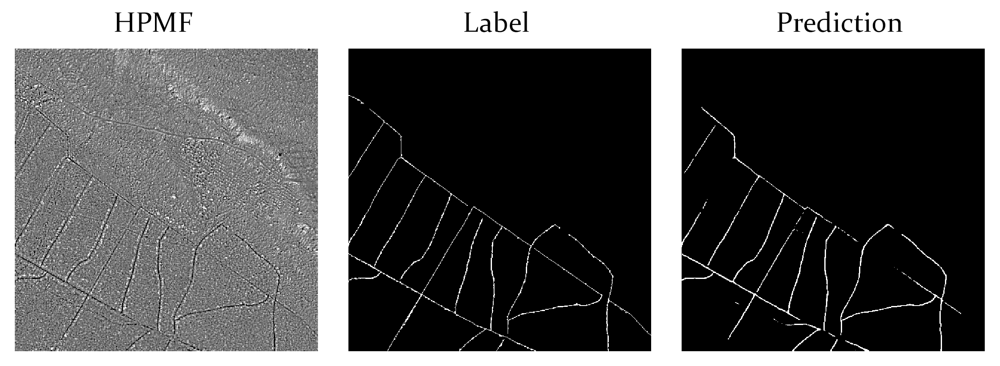

# Conclusions
Mapping drainage ditches is an important first step to find effective landscape and hydrology management strategies. We showed that semantic image segmentation with deep learning from high-resolution ALS data can be used to detect previously unmapped drainage ditches in forested landscapes in the Baltic Sea Region with an overall accuracy of 99 % and a MCC 0.78. This novel technique only requires one topographical index, which makes it possible to implement on large scales with limited computational resources. Our method performs at least equally well, and in fact better on most of the metrics than previous ditch detection studies, despite a more varied and challenging landscape dominated by forests. Visual inspection indicated that this method also classifies natural stream channels as ditches which suggests that a deep neural network can be trained to detect natural stream channels in addition to drainage ditches. 

william.lidberg@slu.se

## References
Lidberg et al 2021. Mapping drainage ditches in forested landscapes using deep learning and aerial laser scanning. In review

Zheng et al 2015. Conditional Random Fields as Recurrent Neural Networks

Audet, J., Wallin, M.B., Kyllmar, K., Andersson, S., Bishop, K., 2017. Nitrous oxide emissions from streams in a Swedish agricultural catchment. Agric. Ecosyst. Environ. 236, 295–303. https://doi.org/10.1016/j.agee.2016.12.012
Ayana, E.K., Fisher, J.R.B., Hamel, P., Boucher, T.M., 2017. Identification of ditches and furrows using remote sensing: application to sediment modelling in the Tana watershed, Kenya. Int. J. Remote Sens. 38, 4611–4630. https://doi.org/10.1080/01431161.2017.1327125

Bailly, J.S., Lagacherie, P., Millier, C., Puech, C., Kosuth, P., 2008. Agrarian landscapes linear features detection from LiDAR: Application to artificial drainage networks. Int. J. Remote Sens. 29, 3489–3508. https://doi.org/10.1080/01431160701469057

Bailly, J.S., Levavasseur, F., Lagacherie, P., 2011. A spatial stochastic algorithm to reconstruct artificial drainage networks from incomplete network delineations. Int. J. Appl. Earth Obs. Geoinf. 13, 853–862. https://doi.org/10.1016/j.jag.2011.06.001

Balado, J., Martínez-Sánchez, J., Arias, P., Novo, A., 2019. Road environment semantic segmentation with deep learning from mls point cloud data. Sensors (Switzerland) 19. https://doi.org/10.3390/s19163466

Benstead, J.P., Leigh, D.S., 2012. An expanded role for river networks. Nat. Geosci. https://doi.org/10.1038/ngeo1593

Bhattacharjee, J., Marttila, H., Haghighi, A.T., Saarimaa, M., Tolvanen, A., Lepistö, A., Futter, M.N., Kløve, B., 2021. Development of Aerial Photos and LIDAR Data Approaches to Map Spatial and Temporal Evolution of Ditch Networks in Peat-Dominated Catchments. J. Irrig. Drain. Eng. 147, 04021006. https://doi.org/10.1061/(asce)ir.1943-4774.0001547

Bishop, K., Buffam, I., Erlandsson, M., Fölster, J., Laudon, H., Seibert, J., Temnerud, J., 2008. Aqua Incognita: The unknown headwaters. Hydrol. Process. https://doi.org/10.1002/hyp.7049

Broersen, T., Peters, R., Ledoux, H., 2017. Automatic identification of watercourses in flat and engineered landscapes by computing the skeleton of a LiDAR point cloud. Comput. Geosci. 106, 171–180. https://doi.org/10.1016/j.cageo.2017.06.003

Cazorzi, F., Fontana, G.D., Luca, A. De, Sofia, G., Tarolli, P., 2013. Drainage network detection and assessment of network storage capacity in agrarian landscape. Hydrol. Process. 27, 541–553. https://doi.org/10.1002/hyp.9224

Chollet, F., 2017. Xception: Deep Learning with Depthwise Separable Convolutions.

Elmore, A.J., Julian, J.P., Guinn, S.M., Fitzpatrick, M.C., 2013. Potential Stream Density in Mid-Atlantic U.S. Watersheds. PLoS One. https://doi.org/10.1371/journal.pone.0074819

Garcia-Garcia, A., Orts-Escolano, S., Oprea, S.O., Villena-Martinez, V., Garcia-Rodriguez, J., 2017. A review on deep learning techniques applied to semantic segmentation. arXiv 1–23.
Graves, J., Mohapatra, R., Flatgard, N., 2020. Drainage ditch berm delineation using lidar data: A case study of Waseca County, Minnesota. Sustain. 12, 1–17. https://doi.org/10.3390/su12229600

Hasselquist, E.M., Lidberg, W., Sponseller, R.A., Ågren, A., Laudon, H., 2018. Identifying and assessing the potential hydrological function of past artificial forest drainage. Ambio 47, 546–556. https://doi.org/10.1007/s13280-017-0984-9

Holden, J., Chapman, P.J., Labadz, J.C., 2004. Artificial drainage of peatlands: Hydrological and hydrochemical process and wetland restoration. Prog. Phys. Geogr. 28, 95–123. https://doi.org/10.1191/0309133304pp403ra

Jensen, C.K., McGuire, K.J., Prince, P.S., 2017. Headwater stream length dynamics across four physiographic provinces of the Appalachian Highlands. Hydrol. Process. 31, 3350–3363. https://doi.org/10.1002/hyp.11259

Julian, J.P., Elmore, A.J., Guinn, S.M., 2012. Channel head locations in forested watersheds across the mid-Atlantic United States: A physiographic analysis. Geomorphology. https://doi.org/10.1016/j.geomorph.2012.07.029

Kiss, K., Malinen, J., Tokola, T., 2015. Forest road quality control using ALS data. Can. J. For. Res. 45, 1636–1642. https://doi.org/10.1139/cjfr-2015-0067

Koschorreck, M., Downing, A.S., Hejzlar, J., Marcé, R., Laas, A., Arndt, W.G., Keller, P.S., Smolders, A.J.P., van Dijk, G., Kosten, S., 2020. Hidden treasures: Human-made aquatic ecosystems harbour unexplored opportunities. Ambio 49, 531–540. https://doi.org/10.1007/s13280-019-01199-6

Kuglerová, L., Jyväsjärvi, J., Ruffing, C., Muotka, T., Jonsson, A., Andersson, E., Richardson, J.S., 2020. Cutting Edge: A Comparison of Contemporary Practices of Riparian Buffer Retention Around Small Streams in Canada, Finland, and Sweden. Water Resour. Res. 56, e2019WR026381. https://doi.org/10.1029/2019WR026381

Larson, J., Trivedi, M., 2011. Lidar based off-road negative obstacle detection and analysis. IEEE Conf. Intell. Transp. Syst. Proceedings, ITSC 192–197. https://doi.org/10.1109/ITSC.2011.6083105

Laurén, A., Palviainen, M., Launiainen, S., Leppä, K., Stenberg, L., Urzainki, I., Nieminen, M., Laiho, R., Hökkä, H., 2021. Drainage and stand growth response in peatland forests—description, testing, and application of mechanistic peatland simulator susi. Forests 12, 1–23. https://doi.org/10.3390/f12030293

Lepistö, A., Räike, A., Sallantaus, T., Finér, L., 2021. Increases in organic carbon and nitrogen concentrations in boreal forested catchments — Changes driven by climate and deposition. Sci. Total Environ. 780, 146627. https://doi.org/10.1016/j.scitotenv.2021.146627

Lidberg, W., Nilsson, M., Lundmark, T., Ågren, A.M., 2017. Evaluating preprocessing methods of digital elevation models for hydrological modelling. Hydrol. Process. https://doi.org/10.1002/hyp.11385

Lidman, F., Boily, Å., Laudon, H., Köhler, S.J., 2017. From soil water to surface water-how the riparian zone controls element transport from a boreal forest to a stream. Biogeosciences 14, 3001–3014. https://doi.org/10.5194/bg-14-3001-2017

Lindsay, J.B., 2018. WhiteboxTools User Manual. Guelph. https://doi.org/10.13140/RG.2.2.22964.96648

Lõhmus, A., Remm, L., Rannap, R., 2015. Just a Ditch in Forest? Reconsidering Draining in the Context of Sustainable Forest Management. Bioscience 65, 1066–1076. https://doi.org/10.1093/biosci/biv136

McCabe, M.F., Aragon, B., Houborg, R., Mascaro, J., 2017. CubeSats in Hydrology: Ultrahigh-Resolution Insights Into Vegetation Dynamics and Terrestrial Evaporation. Water Resour. Res. https://doi.org/10.1002/2017WR022240
Mendeley Data [WWW Document], n.d. URL https://data.mendeley.com/drafts/zxkg43jsx8 (accessed 5.27.21).

Nieminen, M., Palviainen, M., Sarkkola, S., Laurén, A., Marttila, H., Finér, L., 2018. A synthesis of the impacts of ditch network maintenance on the quantity and quality of runoff from drained boreal peatland forests. Ambio. https://doi.org/10.1007/s13280-017-0966-y

Passalacqua, P., Belmont, P., Foufoula-Georgiou, E., 2012. Automatic geomorphic feature extraction from lidar in flat and engineered landscapes. Water Resour. Res. 48, 1–18. https://doi.org/10.1029/2011WR010958

Peacock, M., Gauci, V., Baird, A.J., Burden, A., Chapman, P.J., Cumming, A., Evans, J.G., Grayson, R.P., Holden, J., Kaduk, J., Morrison, R., Page, S., Pan, G., Ridley, L.M., Williamson, J., Worrall, F., Evans, C.D., 2019. The full carbon balance of a rewetted cropland fen and a conservation-managed fen. Agric. Ecosyst. Environ. 269, 1–12. https://doi.org/10.1016/j.agee.2018.09.020
Qian, T., Shen, D., Xi, C., Chen, J., Wang, J., 2018. Extracting farmland features from LiDAR-derived DEM for improving flood plain delineation. Water (Switzerland) 10. https://doi.org/10.3390/w10030252

Rapinel, S., Hubert-Moy, L., Clément, B., Nabucet, J., Cudennec, C., 2015. Ditch network extraction and hydrogeomorphological characterization using LiDAR-derived DTM in wetlands. Hydrol. Res. 46, 276–290. https://doi.org/10.2166/nh.2013.121

Rapinel, Sébastien, Hubert-Moya, L., Clémentb’, B., 2015. Combined use of lidar data and multispectral earth observation imagery for wetland habitat mapping. Int. J. Appl. Earth Obs. Geoinf. https://doi.org/10.1016/j.jag.2014.09.002
Roelens, J., Höfle, B., Dondeyne, S., Van Orshoven, J., Diels, J., 2018a. Drainage ditch extraction from airborne LiDAR point clouds. ISPRS J. Photogramm. Remote Sens. 146, 409–420. https://doi.org/10.1016/j.isprsjprs.2018.10.014

Roelens, J., Rosier, I., Dondeyne, S., Van Orshoven, J., Diels, J., 2018b. Extracting drainage networks and their connectivity using LiDAR data. Hydrol. Process. 32, 1026–1037. https://doi.org/10.1002/hyp.11472

Roulet, N.T., Moore, T.R., 1995. The effect of forestry drainage practices on the emission of methane from northern peatlands. Can. J. For. Res. 25, 491–499. https://doi.org/10.1139/x95-055

Russell, P.P., Gale, S.M., Muñoz, B., Dorney, J.R., Rubino, M.J., 2015. A spatially explicit model for mapping headwater streams. J. Am. Water Resour. Assoc. https://doi.org/10.1111/jawr.12250

Shen, C., Laloy, E., Elshorbagy, A., Albert, A., Bales, J., Chang, F.J., Ganguly, S., Hsu, K.L., Kifer, D., Fang, Z., Fang, K., Li, D., Li, X., Tsai, W.P., 2018. HESS Opinions: Incubating deep-learning-powered hydrologic science advances as a community. Hydrol. Earth Syst. Sci. 22, 5639–5656. https://doi.org/10.5194/hess-22-5639-2018

Sikström, U., Hökkä, H., 2016. Interactions between soil water conditions and forest stands in boreal forests with implications for ditch network maintenance. Silva Fenn. 50. https://doi.org/10.14214/sf.1416
Sit, M., Demiray, B.Z., Xiang, Z., Ewing, G.J., Sermet, Y., Demir, I., 2020. A comprehensive review of deep learning applications in hydrology and water resources. Water Sci. Technol. 82, 2635–2670. https://doi.org/10.2166/wst.2020.369

Stanislawski, L., Brockmeyer, T., Shavers, E., 2018. Automated road breaching to enhance extraction of natural drainage networks from elevation models through deep learning. Int. Arch. Photogramm. Remote Sens. Spat. Inf. Sci. - ISPRS Arch. 42, 671–678. https://doi.org/10.5194/isprs-archives-XLII-4-597-2018

Zheng, S., Jayasumana, S., Romera-Paredes, B., Vineet, V., Su, Z., Du, D., Huang, C., Torr, P.H.S., 2015. Conditional Random Fields as Recurrent Neural Networks.
